# Projet NLP - Articles de presse CNN

MOUTTAPA Arnaud, TELITSINE Thibault - CY TECH ING3DS 2023-2024

Ce notebook a pour but d'utiliser nos connaissances en termes de NLP à travers l'étude d'un jeu de données textuel

Pour cela, nous avons choisi le jeu de données "CNN-DailyMail News Text Summarization" sur Kaggle : https://www.kaggle.com/datasets/gowrishankarp/newspaper-text-summarization-cnn-dailymail

Il s'agit d'un jeu de données contenant les articles quotidiens de CNN (Cable News Network), chaîne de télévision d'information en continu américaine. 

Le jeu est séparé en trois sous-jeux : un document d'entraînement, un de validation et un de test. Chaque document contient trois colonnes : l'identifiant du document, le texte du document et un résumé de l'article (affiché avant la lecture de l'article) proposé par son auteur.

Nous allons d'abord procéder à une analyse descriptive des jeux de données (nombre de documents par jeu, taille moyenne des documents...) ainsi qu'à des observations sur les difficultés et les éléments à traiter avant l'étude plus avancée des données. Nous définirons ensuite les objectifs de notre étude, décrirons les étapes effectuées et analyserons les résultats obtenus.  

Modules:

In [1]:
import pandas as pd
import numpy as np
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
import nltk
from nltk.corpus import stopwords
import io# fastText
from gensim.models.keyedvectors import KeyedVectors
from gensim.models.word2vec import Word2Vec

# Ressources nltk utilisées dans le projet.
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

c:\Users\CYTech Student\anaconda3\Lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
[nltk_data] Downloading package stopwords to C:\Users\CYTech
[nltk_data]     Student\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to C:\Users\CYTech
[nltk_data]     Student\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to C:\Users\CYTech
[nltk_data]     Student\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

# 1- Analyse descriptive du jeu de données

In [2]:
data_train = pd.read_csv('Datasets/train.csv')
data_test = pd.read_csv('Datasets/test.csv')
data_validation = pd.read_csv('Datasets/validation.csv')

In [3]:
data_train.head()

,id,article,highlights
0,0001d1afc246a7964130f43ae940af6bc6c57f01,By . Associated Press . PUBLISHED: . 14:11 EST...,"Bishop John Folda, of North Dakota, is taking ..."
1,0002095e55fcbd3a2f366d9bf92a95433dc305ef,(CNN) -- Ralph Mata was an internal affairs li...,Criminal complaint: Cop used his role to help ...
2,00027e965c8264c35cc1bc55556db388da82b07f,A drunk driver who killed a young woman in a h...,"Craig Eccleston-Todd, 27, had drunk at least t..."
3,0002c17436637c4fe1837c935c04de47adb18e9a,(CNN) -- With a breezy sweep of his pen Presid...,Nina dos Santos says Europe must be ready to a...
4,0003ad6ef0c37534f80b55b4235108024b407f0b,Fleetwood are the only team still to have a 10...,Fleetwood top of League One after 2-0 win at S...


In [32]:
print(f"Taille du jeu d'entraînement : {data_train.shape[0]}")
print(f"Taille du jeu de test : {data_test.shape[0]}")
print(f"Taille du jeu de validation : {data_validation.shape[0]}")

Taille du jeu d'entraînement : 287113
Taille du jeu de test : 11490
Taille du jeu de validation : 13368


In [33]:
data_train['article_nbwords'] = data_train['article'].apply(lambda x: len(str(x).split()))
data_train['highlight_nbwords'] = data_train['highlights'].apply(lambda x: len(str(x).split()))
print(f"Longueur moyenne des articles : {data_train['article_nbwords'].mean().round(0)}")
print(f"Longueur moyenne des highlights : {data_train['highlight_nbwords'].mean().round(0)}")

Longueur moyenne des articles : 692.0
Longueur moyenne des highlights : 52.0


Les articles ont en moyenne 692 mots et 52 mots pour les résumés. Puisque les données n'ont pas de label de thème, nous allons appliquer des méthodes de clustering pour observer les documents similaires, et du topic modeling pour déduire les thèmes des clusters.
Pour cela, nous passerons par un traitement spécifique du texte (suppression des mots inutiles : cnn, '--',...) et comparerons différentes techniques de représentation des documents à travers la qualité et la dissimilarité des topics obtenus.

Filtrage sur les 2000 premières valeurs pour alléger les exécutions

In [4]:
data_train = data_train[0:2000]
data_test = data_test[0:2000]
data_validation = data_validation[0:2000]

# 2- Text Processing et Transformations

#### Traitement du corpus : Lemmatisation, Stemming, suppression de stopwords...

In [5]:
import string
def corpus_and_cleaning(text):
#Tokenization du texte
    tokens = word_tokenize(text.lower())

# Suppression des stopwords
    stop_words = set(stopwords.words('english'))
    filtered_tokens = [token for token in tokens if token not in stop_words]

# Suppression de la ponctuation
    filtered_tokens1 = [token for token in filtered_tokens if token not in string.punctuation]

# Suppression des mots personnalisés
    custom_words = ['published', '(cnn)','--', 'cnn']
    filtered_tokens_2 = [token for token in filtered_tokens1 if token not in custom_words]

# Suppression des chiffres
    filtered_tokens_3 = [token for token in filtered_tokens_2 if token.isalpha()]

# Lemmatisation des mots
    lemmatizer = WordNetLemmatizer()
    lemmatized_tokens = [lemmatizer.lemmatize(token) for token in filtered_tokens_3]

# Reconstruction du texte
    cleaned_text = ' '.join(lemmatized_tokens)

    return cleaned_text

##### Application du traitement au corpus

In [6]:
# Lemmatisation du corpus.
data_train['lem_article'] = data_train['article'].apply(corpus_and_cleaning)

In [37]:
data_train.shape

(2000, 6)

In [7]:
data_train.head(2)

,id,article,highlights,lem_article
0,0001d1afc246a7964130f43ae940af6bc6c57f01,By . Associated Press . PUBLISHED: . 14:11 EST...,"Bishop John Folda, of North Dakota, is taking ...",associated press est october updated est octob...
1,0002095e55fcbd3a2f366d9bf92a95433dc305ef,(CNN) -- Ralph Mata was an internal affairs li...,Criminal complaint: Cop used his role to help ...,ralph mata internal affair lieutenant police d...


Aperçu sur premier document:

In [8]:
print(data_train['article'][0])
print(data_train['lem_article'][0])

By . Associated Press . PUBLISHED: . 14:11 EST, 25 October 2013 . | . UPDATED: . 15:36 EST, 25 October 2013 . The bishop of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo, Grand Forks and Jamestown to the hepatitis A virus in late September and early October. The state Health Department has issued an advisory of exposure for anyone who attended five churches and took communion. Bishop John Folda (pictured) of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo, Grand Forks and Jamestown to the hepatitis A . State Immunization Program Manager Molly Howell says the risk is low, but officials feel it's important to alert people to the possible exposure. The diocese announced on Monday that Bishop John Folda is taking time off after being diagnosed with hepatitis A. The diocese says he contracted the infection through contaminated food while attending a conference for newly ordained b

# 3- TF-IDF et différentes méthodes de plongement lexical

#### Word2Vec (entraîné sur le jeu de donnée CNN)
Les cellules ci-dessous sont reprises du cours.

In [9]:
num_features = 50 # Dimension vecteur.
min_word_count = 2 # Occurrence minimale pour être enchassé.
num_workers = 4 # Nombre de coeurs processeurs utilisés durant l'entraînement.
window_size = 6 # Taille fenêtre du contexte.
subsampling = 1e-3 # Valeur de sous-échantillonnage des termes fréquents.

In [10]:
# Données d'entraînement.
token_lists = [word_tokenize(article) for article in data_train["lem_article"]]
token_lists

[['associated',
  'press',
  'est',
  'october',
  'updated',
  'est',
  'october',
  'bishop',
  'fargo',
  'catholic',
  'diocese',
  'north',
  'dakota',
  'exposed',
  'potentially',
  'hundred',
  'church',
  'member',
  'fargo',
  'grand',
  'fork',
  'jamestown',
  'hepatitis',
  'virus',
  'late',
  'september',
  'early',
  'october',
  'state',
  'health',
  'department',
  'issued',
  'advisory',
  'exposure',
  'anyone',
  'attended',
  'five',
  'church',
  'took',
  'communion',
  'bishop',
  'john',
  'folda',
  'pictured',
  'fargo',
  'catholic',
  'diocese',
  'north',
  'dakota',
  'exposed',
  'potentially',
  'hundred',
  'church',
  'member',
  'fargo',
  'grand',
  'fork',
  'jamestown',
  'hepatitis',
  'state',
  'immunization',
  'program',
  'manager',
  'molly',
  'howell',
  'say',
  'risk',
  'low',
  'official',
  'feel',
  'important',
  'alert',
  'people',
  'possible',
  'exposure',
  'diocese',
  'announced',
  'monday',
  'bishop',
  'john',
  'fold

In [11]:
model_W2V = Word2Vec(
    token_lists,
    workers=num_workers,
    vector_size=num_features,
    min_count=min_word_count,
    window=window_size,
    sample=subsampling)

brouillon:
##### https://radimrehurek.com/gensim/models/word2vec.html
la doc, ça aide

In [43]:
model_W2V.wv['police']

array([ 0.01245457, -0.09694702, -0.6451166 , -1.8661168 , -0.32254997,
        0.0824217 ,  2.6489048 ,  2.2345943 , -0.34391218, -2.675397  ,
        3.4984643 ,  1.8069745 , -1.0802805 ,  1.5171357 , -2.376063  ,
       -0.5176104 ,  3.0432289 ,  0.57054615, -2.263167  , -1.9698923 ,
       -0.6922327 , -0.668994  ,  6.7769837 ,  0.7966484 , -0.52861404,
       -0.7309012 ,  0.16256654,  1.8066673 , -3.6938925 ,  0.16036624,
        0.19594304,  0.54646915,  0.3080901 , -0.27201653,  1.0647693 ,
        0.145652  , -0.40085295, -1.6949137 , -2.9158878 , -0.6230216 ,
        1.004112  , -1.703091  , -0.04925667, -0.8065794 ,  0.46394178,
        0.11231676,  0.3121365 , -1.1056709 , -0.52118975,  2.3508332 ],
      dtype=float32)

In [44]:
similar_words = model_W2V.wv.most_similar('police', topn=5)

# Print the similar words
for word, similarity in similar_words:
    print(word, similarity)

officer 0.954305112361908
fire 0.8987298011779785
suspect 0.895063042640686
polanco 0.8931788802146912
trujillo 0.880842387676239


#### Global Vector (pré-entraîné)
Programmes repris de l'article suivant:  
https://medium.com/analytics-vidhya/basics-of-using-pre-trained-glove-vectors-in-python-d38905f356db

In [13]:
def glove_read_file(file_path: str)->dict:
    """
    Constitue un dictionnaire de plongement lexical GloVe (modèle pré-entrainé)
    partir d'un fichier du site suivant:
    https://nlp.stanford.edu/projects/glove/
    """
    embedding = {}
    with open(file_path, 'r', encoding="utf-8") as f:
        
        for line in f:
            values = line.split()
            word = values[0]
            vector = np.asarray(values[1:], "float32")
            embedding[word] = vector
            
    return embedding

In [14]:
# Démonstration: reprendre le plongement lexicale d'un GloVe entraîné sur Wikipédia et Gigaword 5.
# Modèle entrainé en plusieurs dimensions: 50, 100 et 200.
embedding = glove_read_file("glove.6B.50d.txt")
embedding_100 = glove_read_file("glove.6B.100d.txt")
embedding_200 = glove_read_file("glove.6B.200d.txt")
embedding_300 = glove_read_file("glove.6B.300d.txt")

In [47]:
embedding["police"]

array([ 0.49725 , -1.1949  ,  0.37137 , -0.081662,  0.69114 , -0.69982 ,
       -0.25723 ,  0.5943  ,  0.059978, -1.499   , -0.07122 , -1.0053  ,
       -0.73845 , -0.40988 ,  0.43074 , -0.46757 , -0.36498 ,  0.29674 ,
       -0.62775 , -0.41573 ,  0.28614 ,  1.1718  , -0.21516 ,  0.62029 ,
       -0.85242 , -2.4672  ,  0.14414 ,  0.066415, -0.37916 , -0.65373 ,
        2.7482  , -0.28856 , -0.45409 , -1.354   ,  0.58534 ,  1.0112  ,
        0.67715 , -1.1708  ,  0.36475 ,  1.1886  , -0.28727 ,  1.2292  ,
        0.58489 , -0.20625 ,  0.90859 , -0.88349 , -0.85085 ,  0.12378 ,
        0.85397 , -0.65035 ], dtype=float32)

In [17]:
embedding_100["police"]

array([ 0.1049  , -0.86604 , -0.18197 , -0.72754 , -0.3902  ,  1.5339  ,
       -0.44362 ,  1.0582  ,  0.27323 ,  1.0541  , -0.097547,  0.11879 ,
        0.21506 ,  0.41213 , -0.015035,  0.085687,  0.62685 , -0.48606 ,
       -1.4832  ,  0.054788,  1.2538  , -0.7414  ,  0.45702 , -0.45541 ,
       -0.60237 , -0.43152 ,  0.41912 , -0.75058 ,  0.047356,  0.4164  ,
        0.067822, -0.51007 , -0.43174 ,  0.62177 ,  0.26511 , -1.1647  ,
       -0.11742 , -0.054609,  1.2499  ,  0.46319 , -0.37561 , -0.20357 ,
        0.68529 , -0.17209 ,  0.27742 ,  0.13279 , -0.16843 , -0.091958,
        0.26287 , -0.21859 ,  0.63782 , -0.42959 , -0.22181 ,  1.7921  ,
       -0.34111 , -1.5887  , -0.82064 ,  0.23953 ,  1.8556  ,  0.55727 ,
       -0.35967 ,  0.70907 , -0.024148,  0.57945 ,  0.48563 , -0.21334 ,
        0.060956,  0.35844 ,  0.79628 ,  1.2526  , -0.093424, -0.78124 ,
        0.2308  , -1.0177  ,  0.43092 ,  0.29937 ,  0.52166 ,  0.40109 ,
       -1.4047  ,  0.084946,  1.6508  , -0.16834 , 

In [15]:
def glove_sort_closest(embedding, selected_word):
    """
    Renvoie les autres mots du vocabulaire, rangés par ordre de proximité
    à word.
    """
    return sorted(embedding.keys(), key=lambda word: np.linalg.norm(embedding[word]-embedding[selected_word]))

In [16]:
# Démonstration: donner les 5 mots les plus proches de "king".
glove_sort_closest(embedding, "police")[:5]

['police', 'officers', 'policemen', 'authorities', 'guards']

In [50]:
from sklearn.feature_extraction.text import CountVectorizer

# Sample corpus (replace with your actual corpus)
corpus = data_train['lem_article'].to_list()

# Create the vectorizer
vectorizer = CountVectorizer()

# Fit the vectorizer to learn the vocabulary
vectorizer.fit(corpus)

# Get the bag-of-words representation
X = vectorizer.transform(corpus)

# Print the document-term matrix (bag-of-words)
print(vectorizer.get_feature_names_out())

['aa' 'aaa' 'aachen' ... 'öland' 'özyakup' 'ﬁrst']


In [22]:
# Vérifier que le modèle couvre bien le vocabulaire de notre jeu d'entraînement.
missing = [word for word in vectorizer.get_feature_names_out() if word not in list(embedding.keys())]

n_missing = len(missing)
n_total = len(vectorizer.get_feature_names_out())

print(f'Mots non référencés: {n_missing}/{n_total} ~ {round(n_missing/n_total*100,2)}%')
missing

KeyboardInterrupt: 

In [41]:
# Brouillon: enregistré les mots manquants pour futur nettoyage des données (yen a besoin)
with open("missing_from_glove.6B.50d.txt",'w',encoding="utf-8") as f:
    f.write(str(missing).replace(' ', '\n'))

##### Code pour relire le fichier texte "Missing_from_glove.6B.50d.txt":

In [18]:
with open('missing_from_glove.6B.50d.txt', 'r') as f:
    missing_2 = [word.replace(',\n','').replace('[','').replace(']','').replace("'",'') for word in f.readlines()]

missing_2

['aarthun',
 'aayega',
 'abdulbaki',
 'abdurabu',
 'abedine',
 'acclimatises',
 'ackner',
 'aclimmatised',
 'acuario',
 'addictionjustin',
 'additonally',
 'adebolajo',
 'adeokun',
 'admilton',
 'admt',
 'afobe',
 'afrer',
 'afromosia',
 'againstqualifier',
 'agakhanyan',
 'agbolahor',
 'ahlittia',
 'ahmadinejihad',
 'airdire',
 'airprox',
 'aisikaier',
 'akbearhugger',
 'aktan',
 'alberfa',
 'alberge',
 'alcaucin',
 'alderwiereld',
 'alenah',
 'alhem',
 'aliaa',
 'aliahna',
 'alkhshali',
 'alkikatt',
 'allphones',
 'allweis',
 'almondsfood',
 'almondsromaine',
 'alvarezg',
 'amalur',
 'amazonis',
 'amendolia',
 'amers',
 'anatoliiy',
 'andenoids',
 'andoirdly',
 'andraka',
 'androidly',
 'andwas',
 'angalina',
 'anglys',
 'anotjer',
 'anunborn',
 'apaprently',
 'apcoa',
 'appledoorm',
 'aprocta',
 'aqab',
 'arachnological',
 'arciniegas',
 'ardron',
 'argentineas',
 'argentininian',
 'arguido',
 'ariet',
 'arkhill',
 'armentihres',
 'arseniusz',
 'artisocratic',
 'asescort',
 'asimir'

In [19]:
# On modifie le cleaning pour qu'il inclue les mots manquants.
import string
def corpus_and_cleaning_2(text):
#Tokenization du texte
    tokens = word_tokenize(text.lower())

# Suppression des stopwords
    stop_words = set(stopwords.words('english'))
    filtered_tokens = [token for token in tokens if token not in stop_words]

# Suppression de la ponctuation
    filtered_tokens1 = [token for token in filtered_tokens if token not in string.punctuation]

# Suppression des mots personnalisés
    custom_words = ['published', '(cnn)','--', 'cnn', 'said', 'police', 'mr', 'year']
    filtered_tokens_2 = [token for token in filtered_tokens1 if token not in custom_words]

# Suppression des mots manquants du modèle
    filtered_tokens_3 = [token for token in filtered_tokens_2 if token not in missing_2]

# Suppression des chiffres
    filtered_tokens_4 = [token for token in filtered_tokens_3 if token.isalpha()]

# Lemmatisation des mots
    lemmatizer = WordNetLemmatizer()
    lemmatized_tokens = [lemmatizer.lemmatize(token) for token in filtered_tokens_4]

# Reconstruction du texte
    cleaned_text = ' '.join(lemmatized_tokens)

    return cleaned_text

In [20]:
data_train['lem_article_v2'] = data_train['article'].apply(corpus_and_cleaning_2)

In [21]:
data_train.head(2)

,id,article,highlights,lem_article,lem_article_v2
0,0001d1afc246a7964130f43ae940af6bc6c57f01,By . Associated Press . PUBLISHED: . 14:11 EST...,"Bishop John Folda, of North Dakota, is taking ...",associated press est october updated est octob...,associated press est october updated est octob...
1,0002095e55fcbd3a2f366d9bf92a95433dc305ef,(CNN) -- Ralph Mata was an internal affairs li...,Criminal complaint: Cop used his role to help ...,ralph mata internal affair lieutenant police d...,ralph mata internal affair lieutenant departme...


# 4- Clustering des données avec le nouveau nettoyage et les plongements lexicaux retenus.

### Recherche du meilleur nombre de clusters k

###### Nous utilisons la méthode du coude et le score silhouette pour déterminer le meilleur nombre de clusters à utiliser pour le K-means.
###### Pour la méthode du coude, le k optimal peut être déterminé par l'itération à laquelle la pente augmente significativement (elle peut rester négative).
###### Pour le score silhouette, le meilleur k est celui pour lequel on obtient le meilleur score silhouette.

In [22]:
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score

def plot_kmeans(X):
    """
    Procédure affichant les graphiques pour déterminer
    le k adéquat.
    """
    ssd = []
    silhouette_scores = []

    list_k = list(range(2, 10))
    num_runs = 100

    avg_ssd = np.zeros(len(list_k))
    avg_silhouette_scores = np.zeros(len(list_k))

    # Collection des SSE et scores silhouettes.
    for i in range(num_runs):
        ssd = []
        silhouette_scores = []
        for k in list_k:
            model = KMeans(n_clusters=k, init='k-means++', max_iter=100, n_init=1)
            model.fit(X)
            ssd.append(model.inertia_)
            silhouette_scores.append(silhouette_score(X, model.labels_))
        avg_ssd += np.array(ssd)
        avg_silhouette_scores += np.array(silhouette_scores)

    # Calcul moyenne
    avg_ssd /= num_runs
    avg_silhouette_scores /= num_runs

    # Graphique SSE
    plt.figure(figsize=(6, 6))
    plt.plot(list_k, avg_ssd, '-o')
    plt.xlabel(r'Number of clusters *k*')
    plt.ylabel('Average Sum of squared distance')
    plt.show()

    # Graphique Silhouette
    plt.figure(figsize=(6, 6))
    plt.plot(list_k, avg_silhouette_scores, '-o')
    plt.xlabel(r'Number of clusters *k*')
    plt.ylabel('Average Silhouette score')
    plt.show()

### Procédures de tracé d'ACP en 2D pour visualiser les clusters 
T-SNE était aussi considéré, mais il n'a bien marché que sur le TF-IDF.

In [27]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

def plot_clusters_PCA(X):

    # Réduction en dimension 2.
    pca = PCA(n_components=2)
    reduced_features = pca.fit_transform(X.toarray())

    # Tracé nuage de point.
    plt.scatter(reduced_features[:,0], reduced_features[:,1], c=labels)
    plt.show()

In [28]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

def plot_clusters_PCA_2(X):

    # Réduction de la dimension
    pca = PCA(n_components=2)
    reduced_features = pca.fit_transform(X)

    # Nuage de points
    plt.scatter(reduced_features[:,0], reduced_features[:,1], c=labels)
    plt.show()

### K-means / TF-IDF

In [24]:
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score

vectorizer = TfidfVectorizer(stop_words='english')
X_tf_idf = vectorizer.fit_transform(data_train['lem_article_v2'])

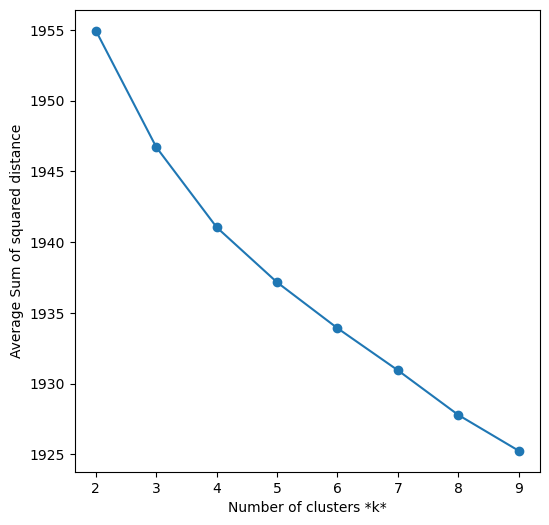

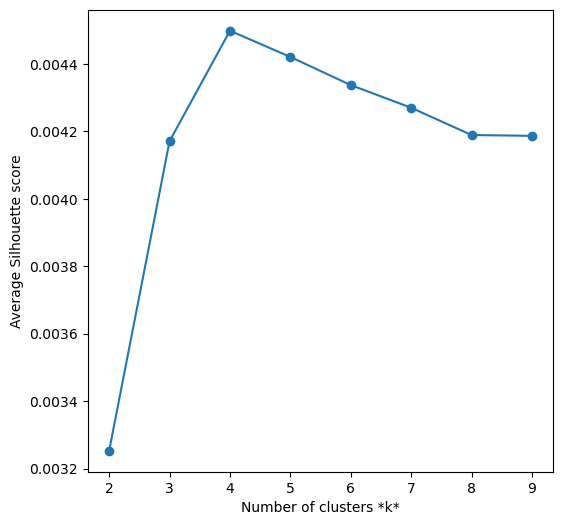

In [56]:
plot_kmeans(X_tf_idf)

#### 

4 semble être le meilleur.

#### Assignation des clusters aux documents

In [25]:
k = 4
model = KMeans(n_clusters=k, init='k-means++', max_iter=100, n_init=1)
model.fit(X_tf_idf)

labels = model.labels_
data_train['label_Kmeans_Tf_Idf'] = labels

In [26]:
data_train.head(2)

,id,article,highlights,lem_article,lem_article_v2,label_Kmeans_Tf_Idf
0,0001d1afc246a7964130f43ae940af6bc6c57f01,By . Associated Press . PUBLISHED: . 14:11 EST...,"Bishop John Folda, of North Dakota, is taking ...",associated press est october updated est octob...,associated press est october updated est octob...,0
1,0002095e55fcbd3a2f366d9bf92a95433dc305ef,(CNN) -- Ralph Mata was an internal affairs li...,Criminal complaint: Cop used his role to help ...,ralph mata internal affair lieutenant police d...,ralph mata internal affair lieutenant departme...,2


#### Représentation en 2D des clusters (en passant par une Analyse en Composantes Principales)

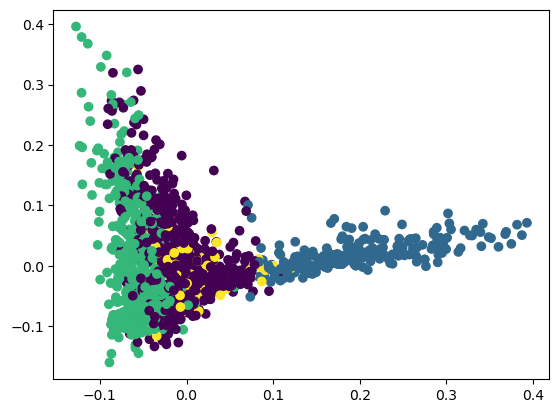

In [29]:
plot_clusters_PCA(X_tf_idf)

3 clusters sur 4 sont bien visibles.

### K-Means/Word2Vec

Tokenisation des phrases et représentation définition des modèles Word2Vec avec différentes dimensions de vecteur (50, 100, 200, 300)

In [30]:
from gensim.models import Word2Vec
import nltk
import re

# Documents (nettoyés) mis sous forme de tokens.
tokenized_sentences = [nltk.word_tokenize(re.sub(r'\W', ' ', article).lower()) for article in data_train['lem_article_v2']]

# Le premier modèle essayé a une dimension de plongement lexical de 50.
model_w2v = Word2Vec(sentences=tokenized_sentences, vector_size=50, window=5, min_count=5, workers=4)

In [31]:
# D'autres sont essayés à dimensions 100, 200 et 300.
model_w2v_100 = Word2Vec(sentences=tokenized_sentences, vector_size=100, window=5, min_count=5, workers=4)
model_w2v_200 = Word2Vec(sentences=tokenized_sentences, vector_size=200, window=5, min_count=5, workers=4)
model_w2v_300 = Word2Vec(sentences=tokenized_sentences, vector_size=300, window=5, min_count=5, workers=4)

Définition et application de la fonction pour faire l'embedding Word2Vec pour chaque document

In [32]:
def document_vector(word2vec_model, doc):
    # Les mots hors du vocabulaire ne comptent pas.
    doc = [word for word in doc if word in word2vec_model.wv.key_to_index]
    return np.mean(word2vec_model.wv[doc], axis=0)

data_train['doc_embedding_word2vec'] = data_train['lem_article_v2'].apply(lambda doc: document_vector(model_w2v, doc))
data_train['doc_embedding_word2vec_100'] = data_train['lem_article_v2'].apply(lambda doc: document_vector(model_w2v_100, doc))
data_train['doc_embedding_word2vec_200'] = data_train['lem_article_v2'].apply(lambda doc: document_vector(model_w2v_200, doc))
data_train['doc_embedding_word2vec_300'] = data_train['lem_article_v2'].apply(lambda doc: document_vector(model_w2v_300, doc))

In [33]:
data_train.head(2)

,id,article,highlights,lem_article,lem_article_v2,label_Kmeans_Tf_Idf,doc_embedding_word2vec,doc_embedding_word2vec_100,doc_embedding_word2vec_200,doc_embedding_word2vec_300
0,0001d1afc246a7964130f43ae940af6bc6c57f01,By . Associated Press . PUBLISHED: . 14:11 EST...,"Bishop John Folda, of North Dakota, is taking ...",associated press est october updated est octob...,associated press est october updated est octob...,0,"[-0.040282577, 0.13514288, 0.042823307, 0.0406...","[-0.06950454, 0.14464998, 0.089604504, -0.0294...","[0.093069874, -0.00841261, 0.10024717, 0.16390...","[-0.02349002, 0.11612045, -0.031109342, 0.0971..."
1,0002095e55fcbd3a2f366d9bf92a95433dc305ef,(CNN) -- Ralph Mata was an internal affairs li...,Criminal complaint: Cop used his role to help ...,ralph mata internal affair lieutenant police d...,ralph mata internal affair lieutenant departme...,2,"[-0.05471599, 0.12576765, 0.055211887, 0.04763...","[-0.069882005, 0.14516343, 0.102341704, -0.024...","[0.10185464, -0.014215585, 0.10302169, 0.16272...","[-0.028260157, 0.118878916, -0.029695213, 0.10..."


In [34]:
import numpy as np

list_of_arrays = data_train['doc_embedding_word2vec'].tolist()
X_w2v= [arr.tolist() for arr in list_of_arrays]
X_w2v

[[-0.04028257727622986,
  0.13514287769794464,
  0.04282330721616745,
  0.040609121322631836,
  -0.34036770462989807,
  -0.024811673909425735,
  0.27495884895324707,
  0.4217691719532013,
  -0.5151086449623108,
  0.03601839393377304,
  0.002017764374613762,
  -0.4195595979690552,
  -0.09627782553434372,
  0.03933478519320488,
  -0.2303459346294403,
  0.15293823182582855,
  0.2586840093135834,
  -0.07261036336421967,
  -0.39208364486694336,
  -0.26758095622062683,
  0.2762739956378937,
  0.276701956987381,
  0.3122802972793579,
  -0.12981157004833221,
  0.21101240813732147,
  0.18851736187934875,
  -0.2503451108932495,
  -0.16608041524887085,
  -0.3043816387653351,
  0.018929313868284225,
  -0.013027411885559559,
  -0.09739533811807632,
  -0.2016877830028534,
  0.011859646067023277,
  -0.12818922102451324,
  0.05985644832253456,
  0.1789781004190445,
  -0.020830806344747543,
  -0.04924877732992172,
  -0.47644463181495667,
  0.4353162348270416,
  -0.2988527715206146,
  -0.190655305981636

Constitution des vecteurs pour le K-Means

In [35]:
list_of_arrays_100 = data_train['doc_embedding_word2vec_100'].tolist()
X_w2v_100= [arr.tolist() for arr in list_of_arrays_100]

list_of_arrays_200 = data_train['doc_embedding_word2vec_200'].tolist()
X_w2v_200= [arr.tolist() for arr in list_of_arrays_200]

list_of_arrays_300 = data_train['doc_embedding_word2vec_300'].tolist()
X_w2v_300= [arr.tolist() for arr in list_of_arrays_300]

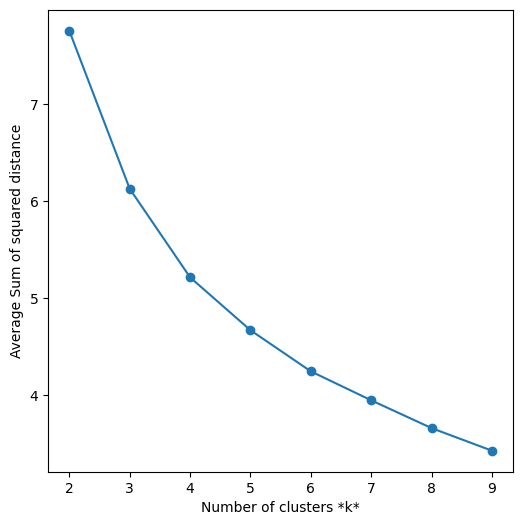

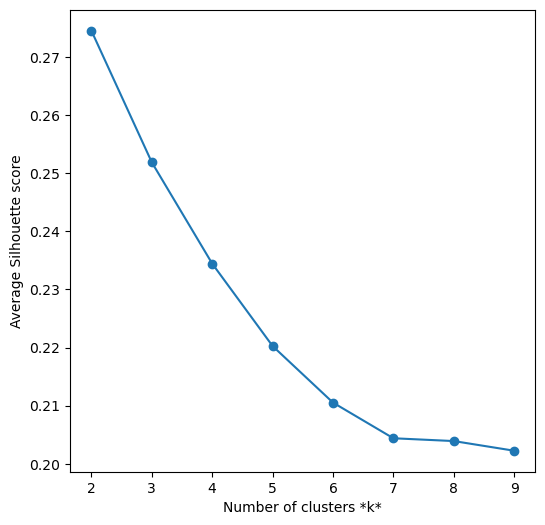

In [75]:
plot_kmeans(X_w2v)

Ajustement du K-Means aux différents vecteurs

In [36]:
# Dimension 50

k = 4
model_w2v = KMeans(n_clusters=k, init='k-means++', max_iter=100, n_init=1)
model_w2v.fit(X_w2v)

labels = model_w2v.labels_
data_train['label_Kmeans_w2v'] = labels

In [37]:
# Dimension 100, 200, 300

k = 4

model_w2v_100 = KMeans(n_clusters=k, init='k-means++', max_iter=100, n_init=1)
model_w2v_100.fit(X_w2v_100)

model_w2v_200 = KMeans(n_clusters=k, init='k-means++', max_iter=100, n_init=1)
model_w2v_200.fit(X_w2v_200)

model_w2v_300 = KMeans(n_clusters=k, init='k-means++', max_iter=100, n_init=1)
model_w2v_300.fit(X_w2v_300)

labels_100 = model_w2v_100.labels_
data_train['label_Kmeans_w2v_100'] = labels_100

labels_200 = model_w2v_200.labels_
data_train['label_Kmeans_w2v_200'] = labels_200

labels_300 = model_w2v_300.labels_
data_train['label_Kmeans_w2v_300'] = labels_300

In [38]:
data_train.head(2)

,id,article,highlights,lem_article,lem_article_v2,label_Kmeans_Tf_Idf,doc_embedding_word2vec,doc_embedding_word2vec_100,doc_embedding_word2vec_200,doc_embedding_word2vec_300,label_Kmeans_w2v,label_Kmeans_w2v_100,label_Kmeans_w2v_200,label_Kmeans_w2v_300
0,0001d1afc246a7964130f43ae940af6bc6c57f01,By . Associated Press . PUBLISHED: . 14:11 EST...,"Bishop John Folda, of North Dakota, is taking ...",associated press est october updated est octob...,associated press est october updated est octob...,0,"[-0.040282577, 0.13514288, 0.042823307, 0.0406...","[-0.06950454, 0.14464998, 0.089604504, -0.0294...","[0.093069874, -0.00841261, 0.10024717, 0.16390...","[-0.02349002, 0.11612045, -0.031109342, 0.0971...",1,2,3,3
1,0002095e55fcbd3a2f366d9bf92a95433dc305ef,(CNN) -- Ralph Mata was an internal affairs li...,Criminal complaint: Cop used his role to help ...,ralph mata internal affair lieutenant police d...,ralph mata internal affair lieutenant departme...,2,"[-0.05471599, 0.12576765, 0.055211887, 0.04763...","[-0.069882005, 0.14516343, 0.102341704, -0.024...","[0.10185464, -0.014215585, 0.10302169, 0.16272...","[-0.028260157, 0.118878916, -0.029695213, 0.10...",0,0,1,0


Affichage des clusters pour Word2Vec

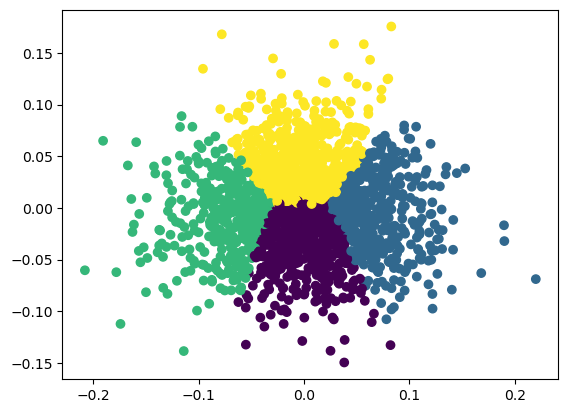

In [39]:
plot_clusters_PCA_2(X_w2v)

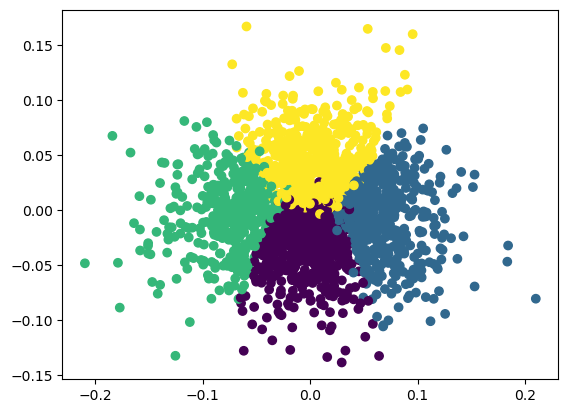

In [40]:
plot_clusters_PCA_2(X_w2v_100)

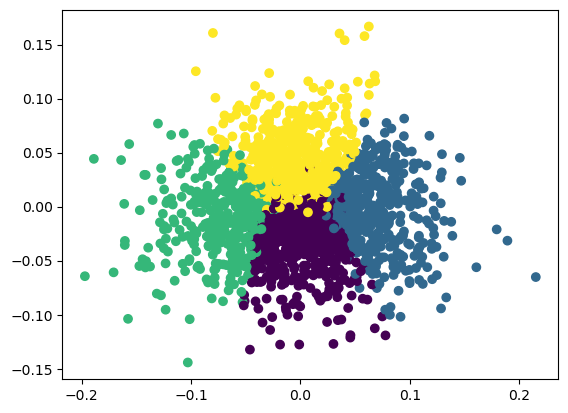

In [41]:
plot_clusters_PCA_2(X_w2v_200)

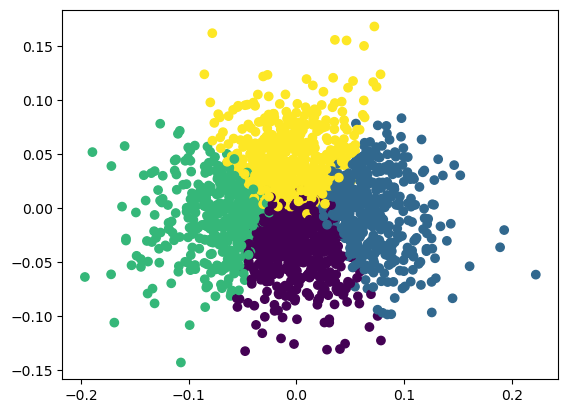

In [42]:
plot_clusters_PCA_2(X_w2v_300)

### K-means/Glove

In [43]:
from gensim.scripts.glove2word2vec import glove2word2vec
from gensim.models import KeyedVectors
import numpy as np

dimensions = [50,100,200,300]
glove_paths = [f'glove.6B.{D}d.txt' for D in dimensions]

for path in glove_paths:
    glove2word2vec(path, path+'.word2vec')


C:\Users\CYTech Student\AppData\Local\Temp\ipykernel_6252\839022970.py:9: DeprecationWarning: Call to deprecated `glove2word2vec` (KeyedVectors.load_word2vec_format(.., binary=False, no_header=True) loads GLoVE text vectors.).
  glove2word2vec(path, path+'.word2vec')


Définition et application de la fonction de représentation vectorielle de chaque document avec GloVe

In [44]:
# Chargement des modèles.
glove_models = {dimensions[i]:KeyedVectors.load_word2vec_format(glove_paths[i]+'.word2vec', binary=False) for i in range(len(dimensions))}

# Représentation vectorielle de document
def document_vector_Glove(word2vec_model, doc):
    doc = [word for word in doc if word in word2vec_model.key_to_index]# les mots non reconnus par le modèle ne sont pas comptés.
    return np.mean(word2vec_model[doc], axis=0)

document_vectors_sets = {D:[document_vector_Glove(glove_models[D], doc) for doc in data_train['lem_article_v2']] for D in dimensions}

Affectation au DataFrame

In [45]:
for D in dimensions:
    data_train[f'doc_embedding_GloVe_{D}'] = document_vectors_sets[D]
    

Formation du dictionnaire contenant les vecteurs GloVe

In [46]:
X_GloVes = {D:[arr.tolist() for arr in document_vectors_sets[D]] for D in dimensions}
X_GloVes[dimensions[0]] # Dimension 50.

[[-0.07796189934015274,
  0.8303126692771912,
  0.6592938303947449,
  0.7112112045288086,
  0.3580065667629242,
  -0.025676583871245384,
  0.36862093210220337,
  -0.7494040131568909,
  -0.24610309302806854,
  -0.004179572686553001,
  -0.14448247849941254,
  0.3881703317165375,
  -0.44656822085380554,
  -0.46466293931007385,
  -0.07720623910427094,
  -0.08252259343862534,
  -0.2522200345993042,
  -0.07114860415458679,
  -0.34819495677948,
  -0.3416205644607544,
  -0.3758591115474701,
  -0.25740888714790344,
  0.7217890620231628,
  0.43523338437080383,
  -0.2006964236497879,
  -0.6971753239631653,
  -0.3110887110233307,
  -0.04439961165189743,
  0.10731016099452972,
  -0.2524532377719879,
  2.4963905811309814,
  -0.08836790174245834,
  -0.2971135675907135,
  0.5675715804100037,
  0.16216428577899933,
  -0.8338844180107117,
  0.5354515314102173,
  -0.4696221947669983,
  0.3308618664741516,
  0.10841213911771774,
  0.7878193855285645,
  0.09535928815603256,
  -0.2175472527742386,
  -0.0357

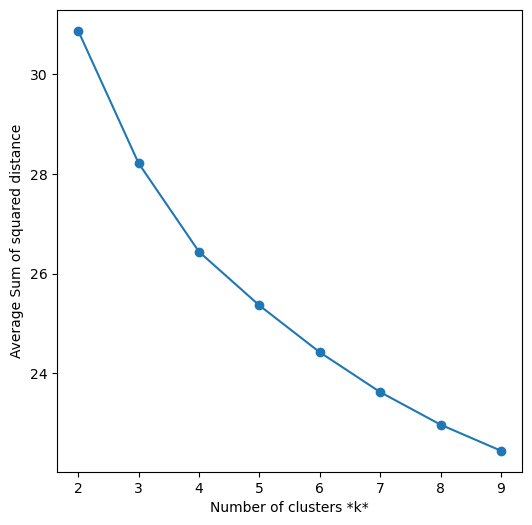

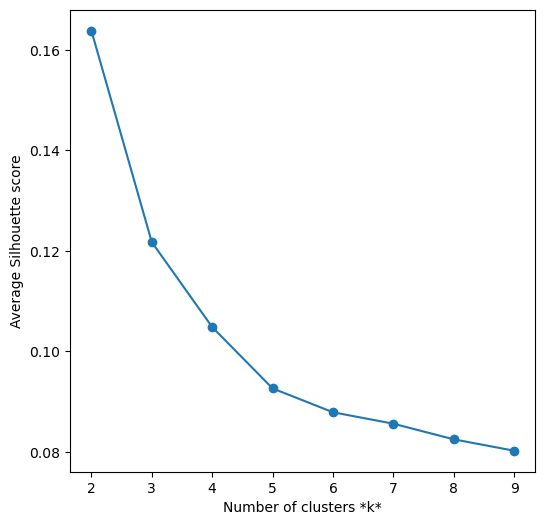

In [85]:
plot_kmeans(X_GloVes[0])

Affectation des clusters à chaque document selon la dimension utilisée pour GloVe

In [47]:
k = 4
for i in range(len(dimensions)):
    X_GloVe = X_GloVes[dimensions[i]]
    gloves_labels_ = {}

    model_GloVe = KMeans(n_clusters=k, init='k-means++', max_iter=100, n_init=1)
    model_GloVe.fit(X_GloVe)

    labels = model_GloVe.labels_
    data_train[f'label_Kmeans_GloVe_{dimensions[i]}'] = labels

Affichage des clusters obtenus avec le modèle GloVe

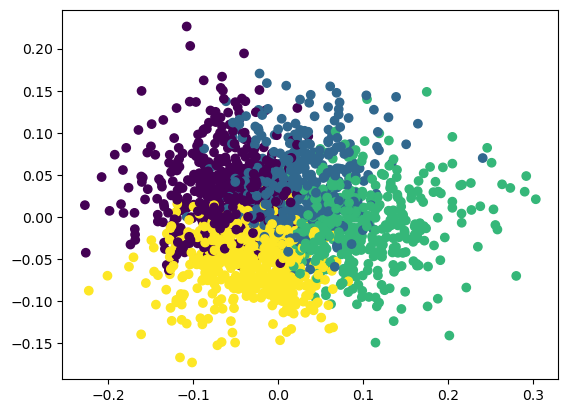

In [55]:
plot_clusters_PCA_2(X_GloVes[50])

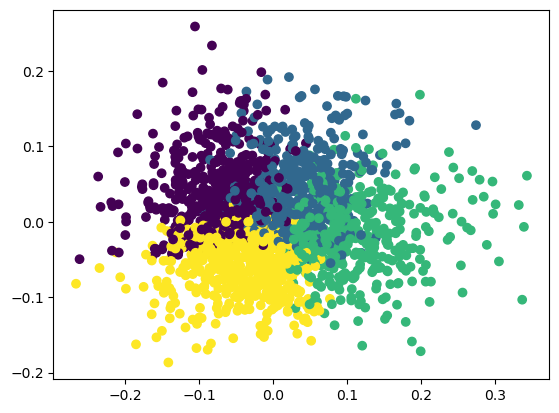

In [56]:
plot_clusters_PCA_2(X_GloVes[100])

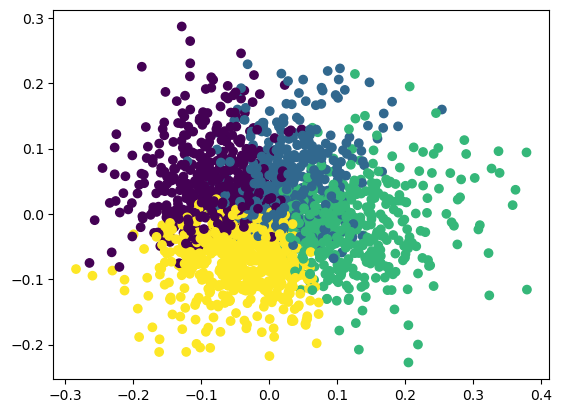

In [58]:
plot_clusters_PCA_2(X_GloVes[200])

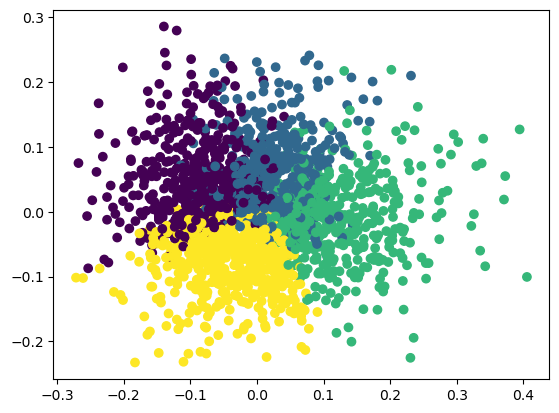

In [59]:
plot_clusters_PCA_2(X_GloVes[300])

In [61]:
data_train.head(2)

,id,article,highlights,lem_article,lem_article_v2,label_Kmeans_Tf_Idf,doc_embedding_word2vec,doc_embedding_word2vec_100,doc_embedding_word2vec_200,doc_embedding_word2vec_300,...,label_Kmeans_w2v_200,label_Kmeans_w2v_300,doc_embedding_GloVe_50,doc_embedding_GloVe_100,doc_embedding_GloVe_200,doc_embedding_GloVe_300,label_Kmeans_GloVe_50,label_Kmeans_GloVe_100,label_Kmeans_GloVe_200,label_Kmeans_GloVe_300
0,0001d1afc246a7964130f43ae940af6bc6c57f01,By . Associated Press . PUBLISHED: . 14:11 EST...,"Bishop John Folda, of North Dakota, is taking ...",associated press est october updated est octob...,associated press est october updated est octob...,0,"[-0.040282577, 0.13514288, 0.042823307, 0.0406...","[-0.06950454, 0.14464998, 0.089604504, -0.0294...","[0.093069874, -0.00841261, 0.10024717, 0.16390...","[-0.02349002, 0.11612045, -0.031109342, 0.0971...",...,3,3,"[-0.0779619, 0.83031267, 0.65929383, 0.7112112...","[-0.3537387, 0.36432806, 0.08048289, -0.148862...","[0.100638226, 0.57322466, -0.22380958, -0.0126...","[-0.24791864, 0.020607537, -0.2676459, -0.0577...",0,2,0,3
1,0002095e55fcbd3a2f366d9bf92a95433dc305ef,(CNN) -- Ralph Mata was an internal affairs li...,Criminal complaint: Cop used his role to help ...,ralph mata internal affair lieutenant police d...,ralph mata internal affair lieutenant departme...,2,"[-0.05471599, 0.12576765, 0.055211887, 0.04763...","[-0.069882005, 0.14516343, 0.102341704, -0.024...","[0.10185464, -0.014215585, 0.10302169, 0.16272...","[-0.028260157, 0.118878916, -0.029695213, 0.10...",...,1,0,"[-0.10179803, 0.81423604, 0.63303256, 0.654480...","[-0.38318598, 0.36620152, 0.11434791, -0.14058...","[0.10488597, 0.5144036, -0.23708233, -0.086741...","[-0.27182886, 0.03658094, -0.25900117, -0.0724...",3,3,1,2


### Évaluation de la qualité des clusters

#### Score silhouette

Mesure qui détermine à quel point en moyenne chaque point est similaire aux éléments de son propre cluster (entre -1 et 1)

Une mesure qui s'approche de 1 indique que les éléments sont très similaires entre eux et dissimilaires entre les éléments d'autres clusters

s = (b - a) / max(a, b) avec a la distance moyenne entre un élément et tous les autres points du même cluster, et b la distance moyenne entre un point et tous les autres points du cluster le plus proche

In [75]:
from sklearn import metrics

silhouette_score_tf_idf = metrics.silhouette_score(X_tf_idf, data_train['label_Kmeans_Tf_Idf'], metric='euclidean')
silhouette_score_w2v = metrics.silhouette_score(X_w2v, data_train['label_Kmeans_w2v'], metric='euclidean')
silhouette_score_GloVe = metrics.silhouette_score(X_GloVes[50], data_train['label_Kmeans_GloVe_50'], metric='euclidean')

print(f"Silhouette Score (TF-IDF): {silhouette_score_tf_idf}")
print(f"Silhouette Score (Word2Vec): {silhouette_score_w2v}")
print(f"Silhouette Score (GloVe): {silhouette_score_GloVe}")

Silhouette Score (TF-IDF): 0.003928721100548777
Silhouette Score (Word2Vec): 0.23722161431051136
Silhouette Score (GloVe): 0.10522209547429609


In [76]:
silhouette_score_w2v_100 = metrics.silhouette_score(X_w2v_100, data_train['label_Kmeans_w2v_100'], metric='euclidean')
silhouette_score_w2v_200 = metrics.silhouette_score(X_w2v_200, data_train['label_Kmeans_w2v_200'], metric='euclidean')
silhouette_score_w2v_300 = metrics.silhouette_score(X_w2v_300, data_train['label_Kmeans_w2v_300'], metric='euclidean')

print(f"Silhouette Score (Word2Vec 50D): {silhouette_score_w2v}")
print(f"Silhouette Score (Word2Vec 100D): {silhouette_score_w2v_100}")
print(f"Silhouette Score (Word2Vec 200D): {silhouette_score_w2v_200}")
print(f"Silhouette Score (Word2Vec 300D): {silhouette_score_w2v_300}")


Silhouette Score (Word2Vec 50D): 0.23722161431051136
Silhouette Score (Word2Vec 100D): 0.24360665968856038
Silhouette Score (Word2Vec 200D): 0.24730123004794763
Silhouette Score (Word2Vec 300D): 0.24647189072571588


In [77]:
silhouette_score_GloVe_50 = metrics.silhouette_score(X_GloVes[50], data_train['label_Kmeans_GloVe_50'], metric='euclidean')
silhouette_score_GloVe_100 = metrics.silhouette_score(X_GloVes[100], data_train['label_Kmeans_GloVe_100'], metric='euclidean')
silhouette_score_GloVe_200 = metrics.silhouette_score(X_GloVes[200], data_train['label_Kmeans_GloVe_200'], metric='euclidean')
silhouette_score_GloVe_300 = metrics.silhouette_score(X_GloVes[300], data_train['label_Kmeans_GloVe_300'], metric='euclidean')

print(f"Silhouette Score (GloVe 50D): {silhouette_score_GloVe_50}")
print(f"Silhouette Score (GloVe 100D): {silhouette_score_GloVe_100}")
print(f"Silhouette Score (GloVe 200D): {silhouette_score_GloVe_200}")
print(f"Silhouette Score (GloVe 300D): {silhouette_score_GloVe_300}")

Silhouette Score (GloVe 50D): 0.10522209547429609
Silhouette Score (GloVe 100D): 0.09272977635868679
Silhouette Score (GloVe 200D): 0.07836609017278019
Silhouette Score (GloVe 300D): 0.07691338342063649


Score Davies-Bouldin

C'est la moyenne des ratios maximum des distances intra-cluster aux distances inter-cluster
Plus le score est petit, meilleure est la qualité du clustering
Donc il favorise des clusters biens distincts et compacts

DBI = (1/n) * Σ(max(i≠j) (σi + σj) / d(ci, cj))

n : Nombre de clusters.

σi : distance moyenne de tous les éléments du cluster i au centroïde du cluster i.

σj : distance moyenne de tous les éléments du cluster j au centroïde du cluster j.

d(ci, cj) : Distance entre les centroïdes des clusters i et j.

La somme Σ est de 1 à n.

In [79]:
from sklearn.metrics import davies_bouldin_score

# Conversion des matrices sparses en array si cela est nécessaire
X_tf_idf_dense = X_tf_idf.toarray() if hasattr(X_tf_idf, "toarray") else X_tf_idf
X_w2v_dense = X_w2v.toarray() if hasattr(X_w2v, "toarray") else X_w2v
X_GloVe_dense = X_GloVe.toarray() if hasattr(X_GloVe, "toarray") else X_GloVe

db_score_tf_idf = davies_bouldin_score(X_tf_idf_dense, data_train['label_Kmeans_Tf_Idf'])
db_score_w2v = davies_bouldin_score(X_w2v_dense, data_train['label_Kmeans_w2v'])
db_score_GloVe = davies_bouldin_score(X_GloVe_dense, data_train['label_Kmeans_GloVe_50'])

print("Davies-Bouldin score (TF-IDF):", db_score_tf_idf)
print("Davies-Bouldin score (Word2Vec):", db_score_w2v)
print("Davies-Bouldin score (GloVe):", db_score_GloVe)

Davies-Bouldin score (TF-IDF): 13.50616042868377
Davies-Bouldin score (Word2Vec): 1.187010592081906
Davies-Bouldin score (GloVe): 2.7463115639838627


In [85]:
db_score_w2v_100 = davies_bouldin_score(X_w2v_100, data_train['label_Kmeans_w2v_100'])
db_score_w2v_200 = davies_bouldin_score(X_w2v_200, data_train['label_Kmeans_w2v_200'])
db_score_w2v_300 = davies_bouldin_score(X_w2v_300, data_train['label_Kmeans_w2v_300'])

print("Davies-Bouldin score (Word2Vec 50D):", db_score_w2v)
print("Davies-Bouldin score (Word2Vec 100D):", db_score_w2v_100)
print("Davies-Bouldin score (Word2Vec 200D):", db_score_w2v_200)
print("Davies-Bouldin score (Word2Vec 300D):", db_score_w2v_300)

Davies-Bouldin score (Word2Vec 50D): 1.187010592081906
Davies-Bouldin score (Word2Vec 100D): 1.1554109697469277
Davies-Bouldin score (Word2Vec 200D): 1.1577335317205186
Davies-Bouldin score (Word2Vec 300D): 1.151112256873309


In [80]:
from sklearn.metrics import davies_bouldin_score

db_score_GloVe_50 = davies_bouldin_score(X_GloVes[50], data_train['label_Kmeans_GloVe_50'])
db_score_GloVe_100 = davies_bouldin_score(X_GloVes[100], data_train['label_Kmeans_GloVe_100'])
db_score_GloVe_200 = davies_bouldin_score(X_GloVes[200], data_train['label_Kmeans_GloVe_200'])
db_score_GloVe_300 = davies_bouldin_score(X_GloVes[200], data_train['label_Kmeans_GloVe_300'])

print("Davies-Bouldin score (GloVe 50D):", db_score_GloVe_50)
print("Davies-Bouldin score (GloVe 100D):", db_score_GloVe_100)
print("Davies-Bouldin score (GloVe 200D):", db_score_GloVe_200)
print("Davies-Bouldin score (GloVe 300D):", db_score_GloVe_300)

Davies-Bouldin score (GloVe 50D): 2.0999382666504887
Davies-Bouldin score (GloVe 100D): 2.264287440027934
Davies-Bouldin score (GloVe 200D): 2.5283935867342455
Davies-Bouldin score (GloVe 300D): 2.582805130933859


Score Calinski-Harabasz

CH = [(B / (k - 1)) / (W / (n - k))]

B : Matrice indiquant la somme des distances au carré entre chaque centroïdes de cluster par rapport à la moyenne générale

W : Matrice indiquant la somme des distances au carré de chaque éléments par rapport à son cluster respectif

k : Nombre de clusters

n : Nombre d'individus

Favorise les clusterings avec haute distance inter-clusters et faible distance intra-clusters 

In [86]:
from sklearn.metrics import calinski_harabasz_score

ch_score_tf_idf = calinski_harabasz_score(X_tf_idf_dense, data_train['label_Kmeans_Tf_Idf'])
ch_score_w2v = calinski_harabasz_score(X_w2v_dense, data_train['label_Kmeans_w2v'])
ch_score_GloVe = calinski_harabasz_score(X_GloVe_dense, data_train['label_Kmeans_GloVe_50'])

print("Calinski-Harabasz score (TF-IDF): ", ch_score_tf_idf)
print("Calinski-Harabasz score (Word2Vec): ", ch_score_w2v)
print("Calinski-Harabasz score (GloVe): ", ch_score_GloVe)

Calinski-Harabasz score (TF-IDF):  6.576902186095257
Calinski-Harabasz score (Word2Vec):  790.7277189589971
Calinski-Harabasz score (GloVe):  175.35357124038055


In [88]:
calinski_harabasz_score_w2v_100 = calinski_harabasz_score(X_w2v_100, data_train['label_Kmeans_w2v_100'])
calinski_harabasz_score_w2v_200 = calinski_harabasz_score(X_w2v_200, data_train['label_Kmeans_w2v_200'])
calinski_harabasz_score_w2v_300 = calinski_harabasz_score(X_w2v_300, data_train['label_Kmeans_w2v_300'])

print("Calinski-Harabasz score (Word2Vec 50D): ", ch_score_w2v)
print("Calinski-Harabasz score (Word2Vec 100D): ", calinski_harabasz_score_w2v_100)
print("Calinski-Harabasz score (Word2Vec 200D): ", calinski_harabasz_score_w2v_200)
print("Calinski-Harabasz score (Word2Vec 300D): ", calinski_harabasz_score_w2v_300)

Calinski-Harabasz score (Word2Vec 50D):  790.7277189589971
Calinski-Harabasz score (Word2Vec 100D):  840.5460660094172
Calinski-Harabasz score (Word2Vec 200D):  835.6059115861874
Calinski-Harabasz score (Word2Vec 300D):  850.2103448302179


In [ ]:
from sklearn.metrics import calinski_harabasz_score

calinski_harabasz_score_GloVe_50 = calinski_harabasz_score(X_GloVes[50], data_train['label_Kmeans_GloVe_50'])
calinski_harabasz_score_GloVe_100 = calinski_harabasz_score(X_GloVes[100], data_train['label_Kmeans_GloVe_100'])
calinski_harabasz_score_GloVe_200 = calinski_harabasz_score(X_GloVes[200], data_train['label_Kmeans_GloVe_200'])
calinski_harabasz_score_GloVe_300 = calinski_harabasz_score(X_GloVes[300], data_train['label_Kmeans_GloVe_300'])


print("Calinski-Harabasz score (GloVe 50D): ", calinski_harabasz_score_GloVe_50)
print("Calinski-Harabasz score (GloVe 100D): ", calinski_harabasz_score_GloVe_100)
print("Calinski-Harabasz score (GloVe 200D): ", calinski_harabasz_score_GloVe_200)
print("Calinski-Harabasz score (GloVe 300D): ", calinski_harabasz_score_GloVe_300)

Calinski-Harabasz score (GloVe 50D):  290.12948963529016
Calinski-Harabasz score (GloVe 100D):  259.2631910296295
Calinski-Harabasz score (GloVe 200D):  200.92807544923053
Calinski-Harabasz score (GloVe 300D):  182.85595539738156


## DBSCAN/TF-IDF

Estimated number of clusters: 0
Estimated number of noise points: 2000
Unique labels: {-1}
Cluster -1: 2000 points


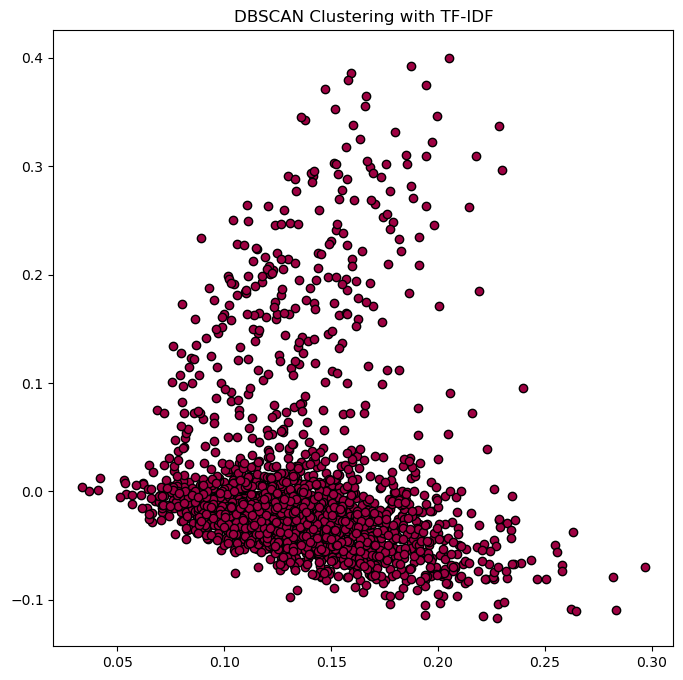

In [117]:
from sklearn.cluster import DBSCAN
from sklearn.decomposition import TruncatedSVD
import matplotlib.pyplot as plt

db = DBSCAN(eps=0.1, min_samples=5).fit(X_tf_idf)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels_db_tf_idf = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels_db_tf_idf)) - (1 if -1 in labels_db_tf_idf else 0)
n_noise_ = list(labels_db_tf_idf).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)



svd = TruncatedSVD(n_components=2)
X_reduced = svd.fit_transform(X_tf_idf)

plt.figure(figsize=(8, 8))
unique_labels = set(labels_db_tf_idf)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

print(f'Unique labels: {unique_labels}')

for k, col in zip(unique_labels, colors):
    class_member_mask = (labels_db_tf_idf == k)

    xy = X_reduced[class_member_mask]
    print(f'Cluster {k}: {len(xy)} points')

    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col), markeredgecolor='k', markersize=6)

plt.title('DBSCAN Clustering with TF-IDF')
plt.show()

Estimated number of clusters: 4
Estimated number of noise points: 0
Unique labels: {0, 1, 2, 3}
Cluster 0: 504 points
Cluster 1: 526 points
Cluster 2: 618 points
Cluster 3: 352 points


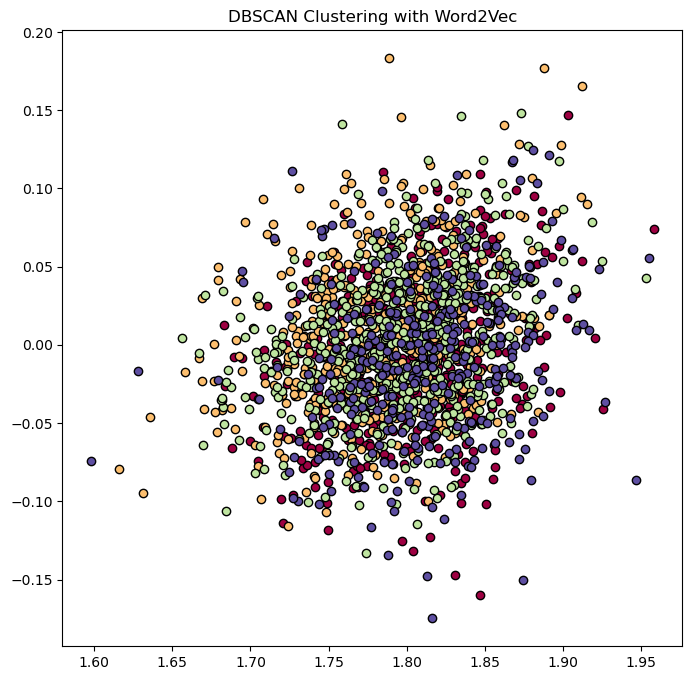

In [103]:
from sklearn.cluster import DBSCAN
from sklearn.decomposition import TruncatedSVD
import matplotlib.pyplot as plt

db = DBSCAN(eps=0.3, min_samples=5).fit(X_w2v)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels_db = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)

svd = TruncatedSVD(n_components=2)
X_reduced = svd.fit_transform(X_w2v)

plt.figure(figsize=(8, 8))
unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

print(f'Unique labels: {unique_labels}')

for k, col in zip(unique_labels, colors):
    class_member_mask = (labels == k)

    xy = X_reduced[class_member_mask]
    print(f'Cluster {k}: {len(xy)} points')

    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col), markeredgecolor='k', markersize=6)

plt.title('DBSCAN Clustering with Word2Vec')
plt.show()

Estimated number of clusters: 4
Estimated number of noise points: 0
Unique labels: {0, 1, 2, 3}
Cluster 0: 504 points
Cluster 1: 526 points
Cluster 2: 618 points
Cluster 3: 352 points


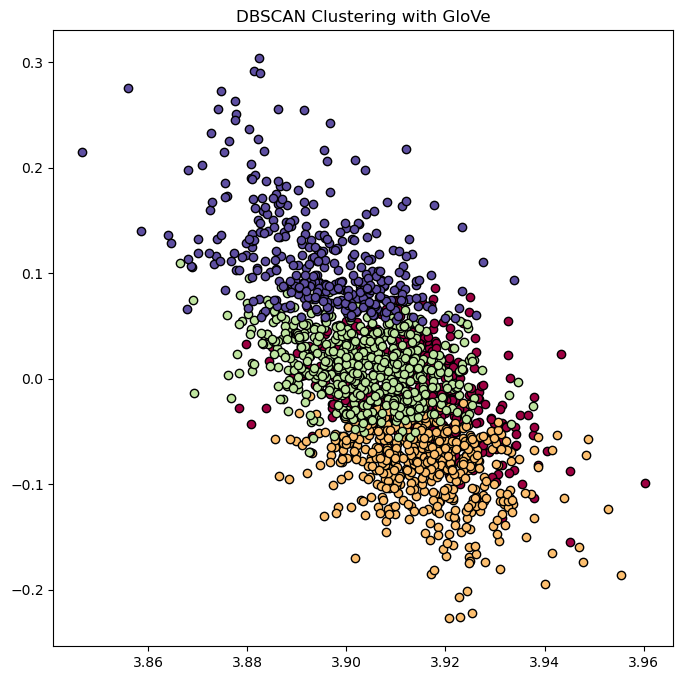

In [105]:
from sklearn.cluster import DBSCAN
from sklearn.decomposition import TruncatedSVD
import matplotlib.pyplot as plt

db = DBSCAN(eps=0.3, min_samples=5).fit(X_GloVe)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels_db = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)

svd = TruncatedSVD(n_components=2)
X_reduced = svd.fit_transform(X_GloVe)

plt.figure(figsize=(8, 8))
unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

print(f'Unique labels: {unique_labels}')

for k, col in zip(unique_labels, colors):
    class_member_mask = (labels == k)

    xy = X_reduced[class_member_mask]
    print(f'Cluster {k}: {len(xy)} points')

    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col), markeredgecolor='k', markersize=6)

plt.title('DBSCAN Clustering with GloVe')
plt.show()

In [109]:
from sklearn.metrics import silhouette_score

score = silhouette_score(X_reduced, labels_db)
print('Silhouette Coefficient: %0.3f' % score)

ValueError: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)

In [124]:
data_train.head(2)

,id,article,highlights,article_nbwords,highlight_nbwords,lem_article,lem_article_v2,label_Kmeans_Tf_Idf,doc_embedding_word2vec,label_Kmeans_w2v,doc_embedding_GloVe,label_Kmeans_GloVe
0,0001d1afc246a7964130f43ae940af6bc6c57f01,By . Associated Press . PUBLISHED: . 14:11 EST...,"Bishop John Folda, of North Dakota, is taking ...",198,37,associated press est october updated est octob...,associated press est october updated est octob...,0,"[-0.0062589077, 0.08235754, -0.009159417, 0.02...",2,"[-0.0779619, 0.83031267, 0.65929383, 0.7112112...",2
1,0002095e55fcbd3a2f366d9bf92a95433dc305ef,(CNN) -- Ralph Mata was an internal affairs li...,Criminal complaint: Cop used his role to help ...,392,38,ralph mata internal affair lieutenant police d...,ralph mata internal affair lieutenant departme...,2,"[-0.015845891, 0.076163076, 0.0007012304, 0.03...",3,"[-0.10179803, 0.81423604, 0.63303256, 0.654480...",3


# Analyse des résultats

In [72]:
summary = pd.DataFrame(columns=['Embedding', 'Dimension of vectors', 'Silhouette score', 'Davies-Bouldin Score', 'Calinski-Harabasz Score'])

In [73]:
summary.head()

,Embedding,Dimension of vectors,Silhouette score,Davies-Bouldin Score,Calinski-Harabasz Score


In [83]:
summary.loc[0] = ['TF-IDF', None, silhouette_score_tf_idf, db_score_tf_idf, ch_score_tf_idf]

In [89]:
summary.loc[1] = ['W2V', 50 ,silhouette_score_w2v, db_score_w2v, ch_score_w2v]
summary.loc[2] = ['W2V', 100 ,silhouette_score_w2v_100, db_score_w2v_100, calinski_harabasz_score_w2v_100]
summary.loc[3] = ['W2V', 200 ,silhouette_score_w2v_200, db_score_w2v_200, calinski_harabasz_score_w2v_200]
summary.loc[4] = ['W2V', 300 ,silhouette_score_w2v_300, db_score_w2v_300, calinski_harabasz_score_w2v_300]
summary.loc[5] = ['GloVe',50 ,silhouette_score_GloVe_50, db_score_GloVe_50, calinski_harabasz_score_GloVe_50]
summary.loc[6] = ['GloVe',100 ,silhouette_score_GloVe_100, db_score_GloVe_100, calinski_harabasz_score_GloVe_100]
summary.loc[7] = ['GloVe',200 ,silhouette_score_GloVe_200, db_score_GloVe_200, calinski_harabasz_score_GloVe_200]
summary.loc[8] = ['GloVe',300 ,silhouette_score_GloVe_300, db_score_GloVe_300, calinski_harabasz_score_GloVe_300]

In [90]:
summary

,Embedding,Dimension of vectors,Silhouette score,Davies-Bouldin Score,Calinski-Harabasz Score
0,TF-IDF,None,0.003929,13.506160,6.576902
1,W2V,50,0.237222,1.187011,790.727719
2,W2V,100,0.243607,1.155411,840.546066
3,W2V,200,0.247301,1.157734,835.605912
4,W2V,300,0.246472,1.151112,850.210345
5,GloVe,50,0.105222,2.099938,290.129490
6,GloVe,100,0.092730,2.264287,259.263191
7,GloVe,200,0.078366,2.528394,200.928075
8,GloVe,300,0.076913,2.582805,182.855955


## Conclusion

Notre étude a donc montré qu'un modèle entraîné sur le jeu de données effectue un clustering plus efficace des documents qu'un modèle préentrainé sur un plus grand jeu de données.

De plus, on voit que TF-IDF, embedding basique, ne nous permet pas de donner un bon clustering sur les documents.

Axes d'amélioration : 

Essayer plusieurs k pour toutes les méthodes (2 et 3).

Utiliser d'autres algorithmes de clustering (DBSCAN par exemple).

Manque d'indicateurs concrets par rapport à la qualité des clusters.